In [52]:
import numpy as np
import matplotlib.pyplot as plt
import pydot
import pickle
import pathlib
import os
from scipy import stats
import random
from sklearn.metrics import r2_score
plt.rcParams['figure.figsize'] = [10, 5]
#import unicode

from scipy.optimize import curve_fit
import re
from sklearn.cluster import AgglomerativeClustering
import pandas as pd
import statistics
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

In [3]:
#directory = str(pathlib.Path(__file__).parent.resolve())
#script_path = str(pathlib.Path(__file__).parent.resolve())
directory = os.getcwd()
script_path = os.getcwd()
nameset,dictset = [],[]
refnameset,refdictset = [],[]

refsortset = []
sortset = []


for filename in os.listdir(directory):
    if filename.endswith(".txt") and '._' not in filename:
        if 'REF' not in filename:
            impath = os.path.join(directory, filename)
            nameset.append(impath)
            this_set = dict()
            with (open(impath, encoding = 'utf8', errors = 'ignore')) as f: #populate dict from text file
                for n in f:
                    pog = n.split('\t')
                    this_set[pog[0]] = pog[-1].count(',')
                f.close()
            try:
                this_set.pop('cell_name')
                this_set.pop('AB')
            except: pass
            dictset.append(this_set)
            sortset.append((impath, this_set))
        else:
            impath = os.path.join(directory, filename)
            refnameset.append(impath)
            this_set = dict()
            with (open(impath, encoding = 'utf8', errors = 'ignore')) as f: #populate dict from text file
                for n in f:
                    pog = n.split('\t')
                    this_set[pog[0]] = pog[-1].count(',')
                f.close()
            try:
                this_set.pop('cell_name')
                this_set.pop('AB')
            except: pass
            refdictset.append(this_set)
            refsortset.append((impath, this_set))
    
print(len(dictset),len(nameset))
print(len(refdictset),len(refnameset))
truncator = len(nameset)

nameset,dictset = [],[]
for n in sorted(sortset):
    nameset.append(n[0]);dictset.append(n[1])

refnameset,refdictset = [],[]
for n in sorted(refsortset):
    refnameset.append(n[0]);refdictset.append(n[1])

1322 1322
30 30


In [4]:
def remove_dangling_children(oldshi):
    poor = list(oldshi);dishi = dict()
    for n in range(1,len(poor)-1):
        if (len(poor[n]) == len(poor[n+1]) or len(poor[n]) == len(poor[n-1])) == False: dishi[poor[n]] = oldshi[poor[n]]
    return dishi

#'''
nameset,dictset = [],[]
for n in sorted(sortset):
    nameset.append(n[0]);dictset.append(remove_dangling_children(n[1]))
    
refnameset,refdictset = [],[]
for n in sorted(refsortset):
    refnameset.append(n[0]);refdictset.append(remove_dangling_children(n[1]))
#'''

In [5]:
print(len(dictset),len(nameset))
print(len(refdictset),len(refnameset))

1322 1322
30 30


In [6]:
#part 1 of common node
refnodelist = set(refdictset[0])
for n in refdictset:
    refnodelist = set(n).intersection(refnodelist)

In [7]:
#part 2 of common node
newdictset = []
for n in refdictset:
    newdict = dict()
    for i in refnodelist:
        newdict[i] = n[i]
    #print(set(newdict).issubset(set(n)))
    #print(len(newdict))
    newdictset.append(newdict)

#print(set(newdict).issubset(set(n)))
refdictset = newdictset

In [8]:
def scramble(dict_list):
    dict_return = []
    for element in dict_list:
        valuescramble = list(element.values())
        random.shuffle(valuescramble)
        keyscramble = list(element)
        random.shuffle(keyscramble)
        new_element = dict()
        for n in range(0,len(keyscramble)):
            new_element[keyscramble[n]] = valuescramble[n]
        dict_return.append(new_element)
    return dict_return
def globalize(dictn):
    globaldictset = []
    for i in dictn:
        tags = sorted(list(i));dip = dict()
        for n in tags:
            if n[0:-1] in i:
                dip[n] = i[n] + dip[n[:-1]]
            else: dip[n] = i[n]    
        globaldictset.append(dip)
    return globaldictset

In [9]:
#scrambledictset = scramble(dictset)
globaldictset = globalize(dictset)
#globalscrambledictset = globalize(scrambledictset)

#refscrambledictset = scramble(refdictset)
refglobaldictset = globalize(refdictset)
#refglobalscrambledictset = globalize(refscrambledictset)

In [10]:
qf = pd.read_csv('1368-embryos.csv', header=None).iloc[0]
df = pd.read_csv('1368-embryos.csv')
rdf = df.sort_values(by = 'embryo-ID')
cuttags = ['ABa','ABp','C','D','E','MS','P']
rearranger = [0,1,4,5,3,2,6]

match_links = []
match_links2 = []

findit = 0
notin = 0

o = 0
for n in range(0,df.shape[0]):
    #print(rdf.iloc[n][1] in nameset[o])
    if rdf.iloc[n][1] in nameset[o]:
        #match_links.append((o,n)) #, o in nameset, #n in dataframe
        match_links.append(n) #index is o in nameset, list value is n in dataframe
        tagref = 0
        for nm in list(globaldictset[o]):
            if cuttags[tagref] not in nm:
                try:
                    tagref = tagref + 1
                    if tagref > 6:
                        break
                except:
                    break
            #findit = findit + (globaldictset[o][nm] >= rdf.iloc[n][rearranger[tagref]+5])
            if (globaldictset[o][nm] >= rdf.iloc[n][rearranger[tagref]+5]): 
                #print(nameset[o].split('/')[-1])
                print(rdf.iloc[n][1])
                print('tag',o,'embryo',n,nm,globaldictset[o][nm],rdf.iloc[n][rearranger[tagref]+5])
                del dictset[o][nm]
        o = o + 1
    else:
        pass
        match_links2.append((o,-1))
        #match_links2.append(-1)
o,n

CUL-1_HYP_E0250
tag 239 embryo 248 ABarppaaaa 185 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABarppaapa 170 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABarppapaa 171 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABarppapap 176 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABarppappa 173 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABarppappp 191 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABarpppaaa 184 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABarpppaap 178 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABarpppapa 179 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABarpppapp 183 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABarppppaa 172 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABarppppap 171 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABarpppppa 176 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABarpppppp 181 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABplappaap 172 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABplappapa 172 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABplapppaa 178 170
CUL-1_HYP_E0250
tag 239 embryo 248 ABplapppap 184 170
CUL-1_HYP_E0250
tag 239 embr

(1322, 1367)

In [12]:
scrambledictset = scramble(dictset)
globaldictset = globalize(dictset)
globalscrambledictset = globalize(scrambledictset)

refscrambledictset = scramble(refdictset)
refglobaldictset = globalize(refdictset)
refglobalscrambledictset = globalize(refscrambledictset)

In [13]:
def single_dim(namein,dictin,seps = '',tier = False):
    namelist,yaxis,xaxis = sorted(list(dictin), key = len ),[],[];target_xaxis=[];target_yaxis=[]
    if seps == '' or tier == True:
        for n in namelist:
            yaxis.append(dictin[n])
            xaxis.append(len(re.sub(r'[A-Z]', '', n)))
    else:
        for n in namelist:
            if seps in n:
                target_yaxis.append(dictin[n])
                target_xaxis.append(len(re.sub(r'[A-Z]', '', n)))
            else:
                yaxis.append(dictin[n])
                xaxis.append(len(re.sub(r'[A-Z]', '', n)))
    xaxis = np.array(xaxis)
    if tier == True: return xaxis, yaxis
    target_xaxis = np.array(target_xaxis)
    m, b, r, p_value, std_err = stats.linregress(np.append(xaxis,target_xaxis),yaxis+target_yaxis)
    namein = namein.split('/')[-1][:-4]
    plt.scatter(xaxis,yaxis, label='Full Lineage,r^2='+str(r**2))
    plt.title('Cellular Division Timing Events in WT C. Elegans Embryo\n'+namein)
    plt.xlabel('Division Event Count');plt.ylabel('Division Event Timing Increments')
    plt.plot(xaxis, (m*xaxis) + b, 'b-', label='Full Lineage slope:'+str(m))
    if seps != '':
        target_xaxis = np.array(target_xaxis)
        m, b, r, p_value, std_err = stats.linregress(target_xaxis,target_yaxis)
        plt.plot(target_xaxis, (m*target_xaxis) + b, 'r-', label=seps+' slope:'+str(m))
        plt.scatter(target_xaxis,target_yaxis, label = seps+',r^2='+str(r**2))    
    plt.legend(loc='upper left');plt.show()

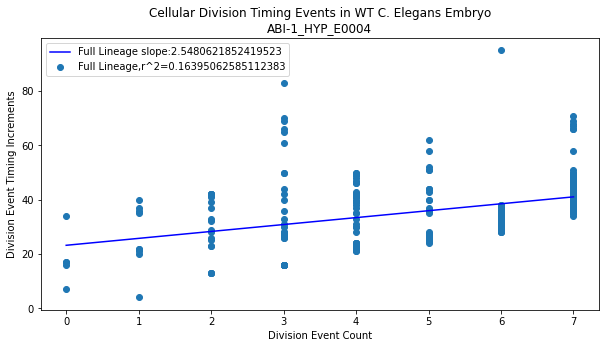

In [14]:
single_dim(nameset[1],dictset[1])

In [15]:
def dict_to_scatter(name,lis,x,y,img = False,seps='', tier = False):
    xaxis = [];yaxis = []
    target_xaxis=[];target_yaxis=[]
    if seps == '' or tier == True:
        for n in (list(set(lis[x]).intersection(set(lis[y])))):
            xaxis.append(lis[x][n]);yaxis.append(lis[y][n])
    else:
        target_xaxis=[];target_yaxis=[]
        for n in (list(set(lis[x]).intersection(set(lis[y])))):
            if seps in n:
                target_xaxis.append(lis[x][n])
                target_yaxis.append(lis[y][n])
            else:
                xaxis.append(lis[x][n]);yaxis.append(lis[y][n])
    target_xaxis = np.array(target_xaxis);xaxis = np.array(xaxis)
    if tier == True: return xaxis, yaxis
    m, b, r, p_value, std_err = stats.linregress(np.append(xaxis,target_xaxis),yaxis+target_yaxis)
    #switch to siegelslope & theilsslope functions?
    name1,name2 = name[x].split('/')[-1][:-4],name[y].split('/')[-1][:-4]
    if img == False: return m,b,r,name1,name2
    plt.scatter(xaxis,yaxis, label='Full Lineage,r^2='+str(r**2) ) #''', c = [0]*len(xaxis) ''')
    plt.title('Cellular Division Timing Discrepancies in WT C. Elegans Embryos');plt.xlabel(name1+'\nDivision Event Timing Increments');plt.ylabel(name2+'\nDivision Event Timing Increments')
    plt.plot(xaxis, (m*xaxis) + b, 'b-', label='Full Lineage slope:'+str(m), )
    if seps != '':
        target_xaxis = np.array(target_xaxis)
        m, b, r, p_value, std_err = stats.linregress(target_xaxis,target_yaxis)
        plt.plot(target_xaxis, (m*target_xaxis) + b, 'r-', label=seps+' slope:'+str(m))
        plt.scatter(target_xaxis,target_yaxis, label = seps+',r^2='+str(r**2) ) #''', c = [1]*len(target_xaxis) ''')
        xaxis = np.append(xaxis,target_xaxis); yaxis = np.append(yaxis,target_yaxis)
    m, b, r, p_value, std_err = stats.linregress(xaxis,yaxis)
    plt.legend(loc='upper left')
    #print(xaxis,target_xaxis)
    #print(np.append(xaxis,target_xaxis))
    #print(yaxis,target_yaxis)
    #print(np.append(yaxis,target_yaxis))
    #plt.savefig(name1+'&'+name2+'.png') #return m,b,r,name1,name2
    plt.show()

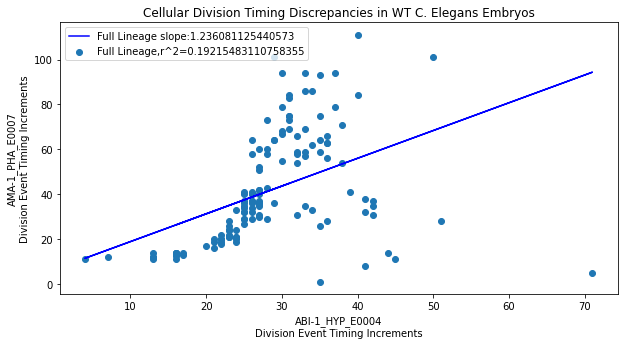

In [16]:
dict_to_scatter(nameset,dictset,1,10,img=True)

In [17]:
def match_fit(xaxis,yaxis):
    sorted_xaxis = np.array(range(min(xaxis),max(xaxis)))
    xaxis = np.array(xaxis)
    p1 = np.poly1d(np.polyfit(xaxis, yaxis, 1));p2 = np.poly1d(np.polyfit(xaxis, yaxis, 2));p3 = np.poly1d(np.polyfit(xaxis, yaxis, 3))
    plt.scatter(xaxis,yaxis, label='Lineage,r^2=') 
    corr_matrix = np.corrcoef(yaxis, p1(xaxis));corr = corr_matrix[0,1];R_sq = corr**2
    plt.plot(xaxis, p1(xaxis), 'b-', label='linear r^2:'+str(R_sq), )
    corr_matrix = np.corrcoef(yaxis, p2(xaxis));corr = corr_matrix[0,1];R_sq = corr**2
    plt.plot(sorted_xaxis, p2(sorted_xaxis), 'r-', label='quad r^2:'+str(R_sq), )
    corr_matrix = np.corrcoef(yaxis, p3(xaxis));corr = corr_matrix[0,1];R_sq = corr**2
    plt.plot(sorted_xaxis, p3(sorted_xaxis), 'g-', label='cubic r^2:'+str(R_sq), )
    plt.title('Cellular Division Timing Discrepancies in WT C. Elegans Embryos')
    #plt.xlabel(name1+'\nDivision Event Timing Increments')
    #plt.ylabel(name2+'\nDivision Event Timing Increments')
    
    
    plt.legend(loc='upper left')
    plt.show()

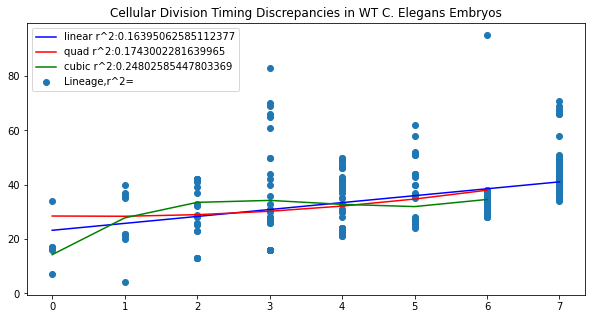

In [18]:
x,y = single_dim(nameset[1],dictset[1],tier = True);match_fit(x,y)

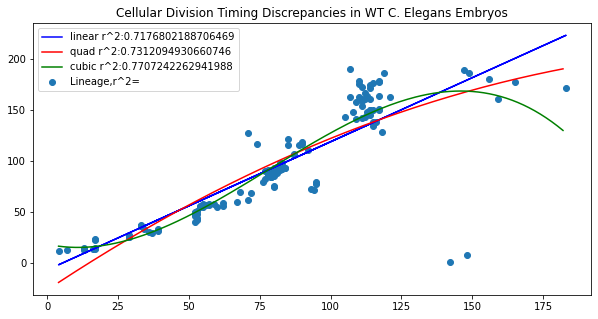

In [19]:
x,y = dict_to_scatter(nameset,globaldictset,1,10,img=True,tier = True); match_fit(x,y)

In [20]:

def dict_to_scatter_connect(name,lis,x,yname,ylis,y,img = False,seps='', tier = False):
    xaxis = [];yaxis = []
    target_xaxis=[];target_yaxis=[]
    if seps == '' or tier == True:
        for n in (list(set(lis[x]).intersection(set(ylis[y])))):
            xaxis.append(lis[x][n]);yaxis.append(ylis[y][n])
    else:
        target_xaxis=[];target_yaxis=[]
        for n in (list(set(lis[x]).intersection(set(ylis[y])))):
            if seps in n:
                target_xaxis.append(lis[x][n])
                target_yaxis.append(ylis[y][n])
            else:
                xaxis.append(lis[x][n]);yaxis.append(ylis[y][n])
    target_xaxis = np.array(target_xaxis);xaxis = np.array(xaxis)
    if tier == True: return xaxis, yaxis
    m, b, r, p_value, std_err = stats.linregress(np.append(xaxis,target_xaxis),yaxis+target_yaxis)
    #switch to siegelslope & theilsslope functions?
    name1,name2 = name[x].split('/')[-1][:-4],yname[y].split('/')[-1][:-4]
    if img == False: return m,b,r,name1,name2
    plt.scatter(xaxis,yaxis, label='Full Lineage,r^2='+str(r**2) ) #''', c = [0]*len(xaxis) ''')
    plt.title('Cellular Division Timing Discrepancies in WT C. Elegans Embryos');plt.xlabel(name1+'\nDivision Event Timing Increments');plt.ylabel(name2+'\nDivision Event Timing Increments')
    plt.plot(xaxis, (m*xaxis) + b, 'b-', label='Full Lineage slope:'+str(m), )
    if seps != '':
        target_xaxis = np.array(target_xaxis)
        m, b, r, p_value, std_err = stats.linregress(target_xaxis,target_yaxis)
        plt.plot(target_xaxis, (m*target_xaxis) + b, 'r-', label=seps+' slope:'+str(m))
        plt.scatter(target_xaxis,target_yaxis, label = seps+',r^2='+str(r**2) ) #''', c = [1]*len(target_xaxis) ''')
        xaxis = np.append(xaxis,target_xaxis); yaxis = np.append(yaxis,target_yaxis)
    m, b, r, p_value, std_err = stats.linregress(xaxis,yaxis)
    plt.legend(loc='upper left')
    #print(xaxis,target_xaxis)
    #print(np.append(xaxis,target_xaxis))
    #print(yaxis,target_yaxis)
    #print(np.append(yaxis,target_yaxis))
    #plt.savefig(name1+'&'+name2+'.png') #return m,b,r,name1,name2
    plt.show()
    


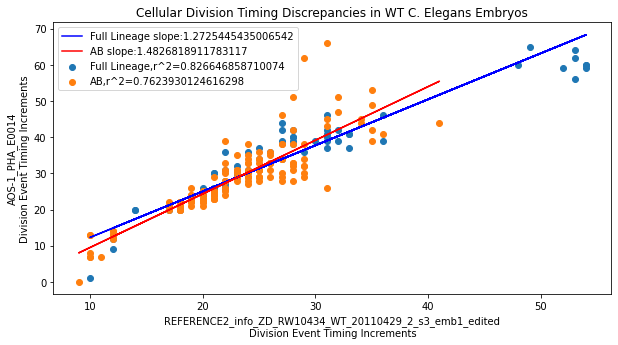

In [21]:
dict_to_scatter_connect(refnameset,refdictset,1,nameset,dictset,17,img=True, seps = 'AB')

In [22]:
def plot_2_examples(colormaps,imp): #heatmap matrix plotting function
    data = imp;n = len(colormaps)
    fig, axs = plt.subplots(1, n, figsize=(n, n),
                            constrained_layout=False, squeeze=False)
    for [ax, cmap] in zip(axs.flat, colormaps):
        psm = ax.pcolormesh(data, cmap=cmap, rasterized=True, vmin=(int(10*np.amin(imp))/10.0), vmax=(int(10*np.amax(imp))/10.0))
        fig.colorbar(psm, ax=ax)
    plt.title('Distance between times in WT C. Elegans')
    #plt.figure(figsize = (15,8))
    plt.gcf().set_size_inches(35, 25)
    plt.show()

In [23]:
def tree_edit_distance(dict1,dict2): return (len((set(dict1).union(set(dict2))))-len((set(dict1).intersection(set(dict2)))))


In [24]:
def branch_distance(dict1,dict2): #issa metric from deeds
    branch_dist = 0
    for n in list(set(dict1).intersection(set(dict2))):
        branch_dist = branch_dist + (dict1[n]-dict2[n])**2
        #print(n,(dict1[n]-dict2[n])**2, branch_dist)
    return (np.sqrt(branch_dist))

In [25]:
qf = pd.read_csv('1368-embryos.csv', header=None).iloc[0]
df = pd.read_csv('1368-embryos.csv')
rdf = df.sort_values(by = 'embryo-ID')
cuttags = ['ABa','ABp','C','D','E','MS','P']
rearranger = [0,1,4,5,3,2,6]

def cleaner(reflis,refgloballis,x,ML,explis,globalexplis,y):
    n = ML[y]
    tagref = 0
    #print(n)
    #print(rdf.iloc[n])
    burner = dict()
    for nm in list(refgloballis[x]):
        #print(nm)
        if cuttags[tagref] not in nm:
            try:
                tagref = tagref + 1
                if tagref > 6:
                    break
            except:
                break
        if refgloballis[x][nm] >= rdf.iloc[n][rearranger[tagref]+5]: #pass
            print(nm,refgloballis[x][nm],rdf.iloc[n][rearranger[tagref]+5])
        else:
            burner[nm] = reflis[x][nm]
    return burner

In [26]:
b_mat = []
size_edit_mat = []
t_mat = []
for n in range(0,len(nameset)):
    t_row = []
    r_row = []
    b_row = []
    for m in range(0,len(refnameset)):
        #go = cleaner(refdictset,refglobaldictset,m,match_links,dictset,globaldictset,n)
        go = refdictset[m]
        r_row.append(len(go))
        t_row.append(tree_edit_distance(go,dictset[n]))
        b_row.append(branch_distance(go,dictset[n]))
    size_edit_mat.append(r_row)
    t_mat.append(t_row)
    b_mat.append(b_row)
    if n % 20 == 0: print(n/len(nameset))
size_edit_mat = np.mat(size_edit_mat)

0.0
0.015128593040847202
0.030257186081694403
0.0453857791225416
0.060514372163388806
0.07564296520423601
0.0907715582450832
0.1059001512859304
0.12102874432677761
0.1361573373676248
0.15128593040847202
0.1664145234493192
0.1815431164901664
0.19667170953101362
0.2118003025718608
0.22692889561270801
0.24205748865355523
0.25718608169440244
0.2723146747352496
0.2874432677760968
0.30257186081694404
0.3177004538577912
0.3328290468986384
0.34795763993948564
0.3630862329803328
0.37821482602118
0.39334341906202724
0.4084720121028744
0.4236006051437216
0.43872919818456885
0.45385779122541603
0.4689863842662632
0.48411497730711045
0.49924357034795763
0.5143721633888049
0.529500756429652
0.5446293494704992
0.5597579425113465
0.5748865355521936
0.5900151285930408
0.6051437216338881
0.6202723146747352
0.6354009077155824
0.6505295007564297
0.6656580937972768
0.680786686838124
0.6959152798789713
0.7110438729198184
0.7261724659606656
0.7413010590015129
0.75642965204236
0.7715582450832073
0.78668683812

In [27]:
size_edit_mat = np.mat(size_edit_mat) - 350
b_mat = np.mat(b_mat);t_mat = np.mat(t_mat)

In [28]:
result = np.where(size_edit_mat < 0)
result

(array([], dtype=int64), array([], dtype=int64))

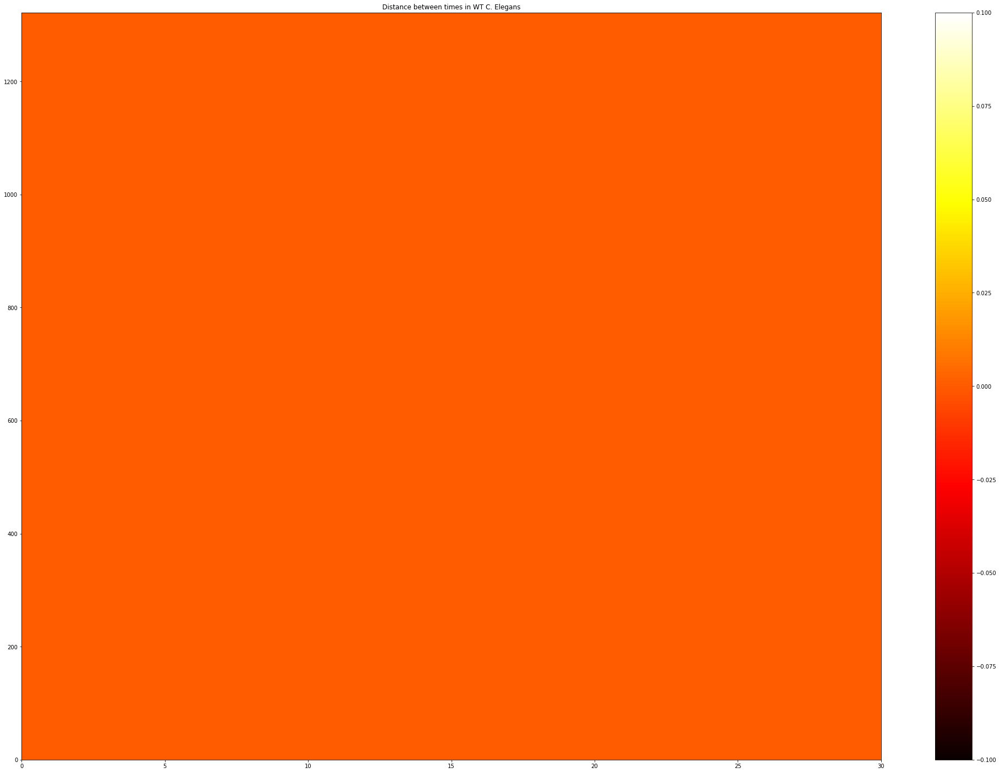

In [29]:
plot_2_examples(['hot'],np.mat(size_edit_mat))

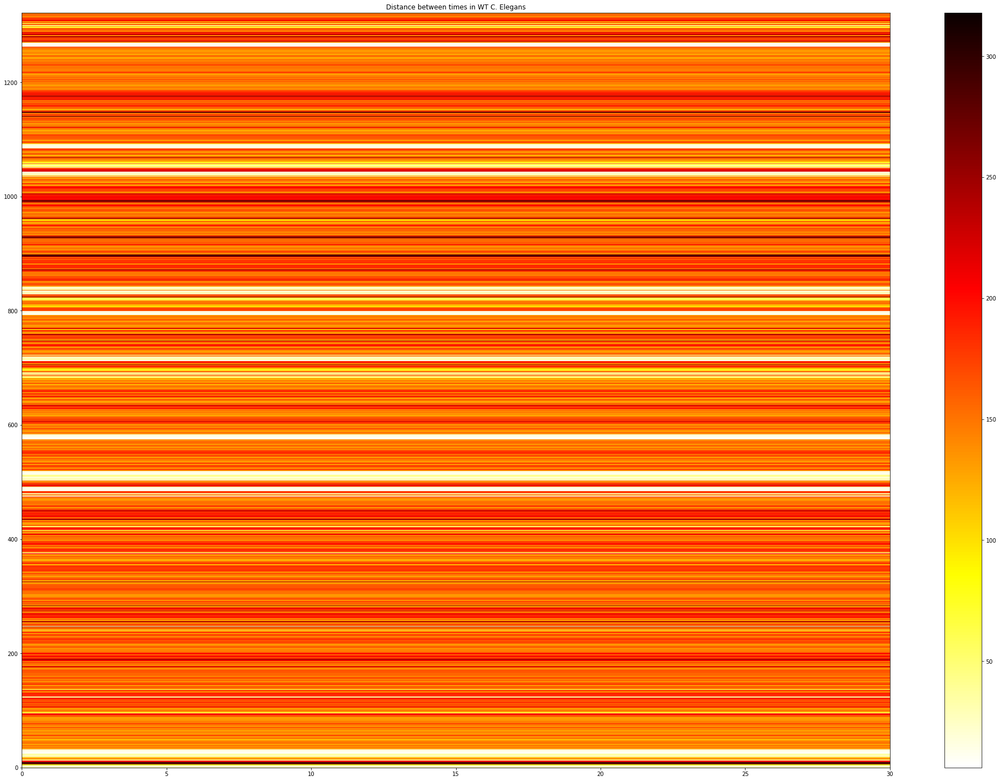

In [30]:
plot_2_examples(['hot_r'],np.mat(t_mat))

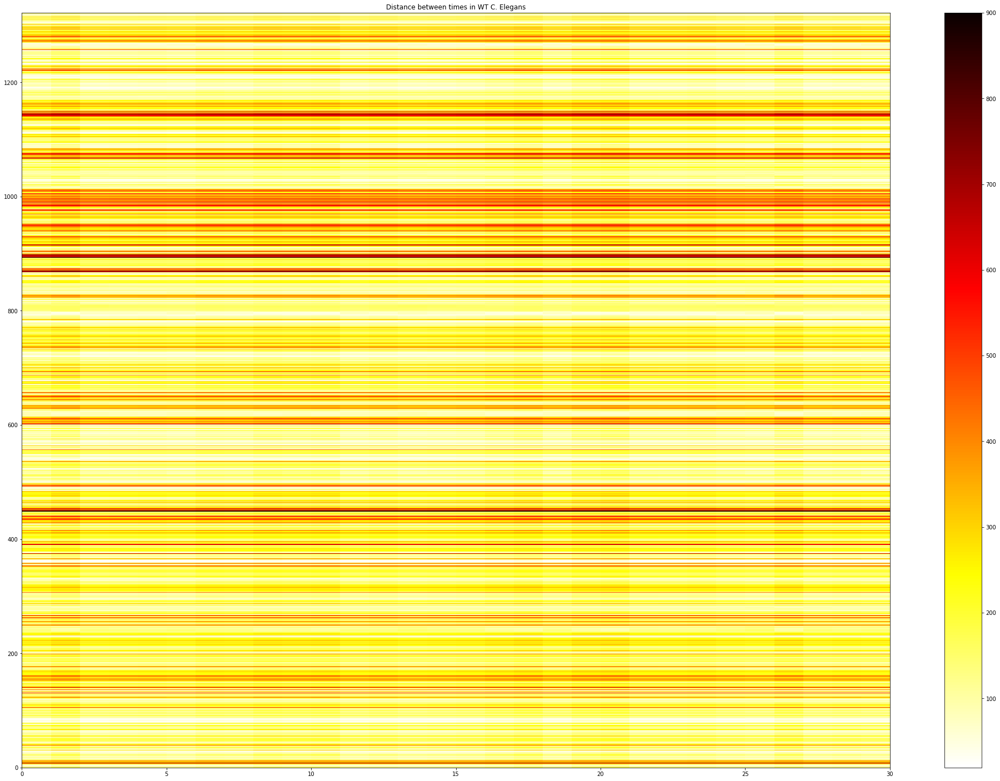

In [31]:
plot_2_examples(['hot_r'],np.mat(b_mat))

In [32]:
RNAi_ted_assignments = dict()
RNAi_bed_assignments = dict()
RNAi_size_assignments = dict()
for n in range(0,len(nameset)):
    pad = nameset[n].split('/')[-1][:-14]
    try:
        x = RNAi_ted_assignments[pad] 
        q = t_mat[n].tolist()[0]
        x.append(q[0])
        y = RNAi_bed_assignments[pad]
        y.append(b_mat[n].tolist()[0])
        
    except:
        x = list()
        q = t_mat[n].tolist()[0]
        x.append(q[0])
        RNAi_ted_assignments[pad] = x#creating new sample class
        y = list()
        y.append(b_mat[n].tolist()[0])
        RNAi_bed_assignments[pad] = y
        

In [33]:
for n in RNAi_ted_assignments: 
    print(n,RNAi_ted_assignments[n],'mu',statistics.mean(RNAi_ted_assignments[n]),'var',statistics.pstdev(RNAi_ted_assignments[n]))


ABI-1 [32, 14, 24, 26, 60, 84] mu 40 var 24.24871130596428
AMA-1 [292, 276, 274, 318, 210, 174] mu 257.3333333333333 var 49.48624949305503
AOS-1 [20, 66, 156, 148, 70, 138] mu 99.66666666666667 var 50.5623927000647
APR-1 [38, 32, 16, 48, 18, 52] mu 34 var 13.662601021279464
APX-1 [6, 12, 8, 14, 6, 22, 16, 16] mu 12.5 var 5.267826876426369
ARX-2 [132, 122, 148, 148, 138, 140] mu 138 var 9.092121131323903
ATX-2 [144, 155, 126, 124] mu 137.25 var 12.871965661856
BUB-1 [152, 160, 142, 152, 142, 126] mu 145.66666666666666 var 10.79608982713443
C01A2.5 [100, 144, 138, 162, 134, 128] mu 134.33333333333334 var 18.669642619920594
C01F1.1 [152, 158, 186, 136, 132] mu 152.8 var 19.20833152566875
C02B10.5 [142, 128, 148, 152, 126, 130, 134] mu 137.14285714285714 var 9.493284414763513
C06A5.1 [148, 144, 128, 174, 162, 140, 136] mu 147.42857142857142 var 14.607797749901962
C07A9.2 [148, 140, 154, 168, 168, 164] mu 157 var 10.567244989431572
C08B11.3 [134, 148, 148, 134, 134, 132, 132] mu 137.4285714

In [102]:
for n in RNAi_bed_assignments: 
    print(n,'mu',np.mean(np.array(RNAi_bed_assignments[n])),'sqrt', np.sqrt(np.var(np.array(RNAi_bed_assignments[n]))) )

ABI-1 mu 97.95512475944969 sqrt 39.660702353065105
AMA-1 mu 408.15917905159813 sqrt 140.2810120212399
AOS-1 mu 118.27256035242512 sqrt 40.09753831338113
APR-1 mu 127.22813783023413 sqrt 32.81836968369075
APX-1 mu 95.22845547176128 sqrt 76.28100201533
ARX-2 mu 136.47573816509671 sqrt 43.32019804846964
ATX-2 mu 273.4775346399901 sqrt 115.98044252042236
BUB-1 mu 117.01516637767062 sqrt 52.772633415493495
C01A2.5 mu 149.42766616571237 sqrt 46.739054878496276
C01F1.1 mu 165.86018495185604 sqrt 75.65200403428034
C02B10.5 mu 93.84274603966855 sqrt 27.720560815480358
C06A5.1 mu 160.05377038279912 sqrt 60.03574423833033
C07A9.2 mu 154.83932189920816 sqrt 70.81839806790677
C08B11.3 mu 40.213051812040085 sqrt 12.930988514501902
C49H3.8 mu 133.34999155273442 sqrt 40.84662066257529
C50F2.3 mu 144.68818597444402 sqrt 29.559562383661703
C55A6.9 mu 134.40219256740872 sqrt 29.076961338699647
CACN-1 mu 248.41624855501007 sqrt 114.71225212325317
CAMT-1 mu 124.46421867585968 sqrt 41.78897305998059
CBP-1 m

In [35]:
trip = np.array(RNAi_bed_assignments['ABI-1'])

(array([[1., 1., 2., 0., 0., 1., 1., 0., 0., 0.],
        [0., 1., 1., 0., 2., 0., 0., 1., 0., 1.],
        [2., 2., 0., 0., 1., 0., 1., 0., 0., 0.],
        [2., 2., 0., 0., 1., 0., 1., 0., 0., 0.],
        [2., 0., 2., 0., 1., 0., 1., 0., 0., 0.],
        [1., 3., 0., 0., 1., 1., 0., 0., 0., 0.],
        [1., 1., 2., 0., 0., 1., 0., 1., 0., 0.],
        [2., 0., 2., 0., 0., 1., 0., 1., 0., 0.],
        [1., 1., 0., 1., 1., 0., 0., 1., 1., 0.],
        [1., 1., 0., 2., 0., 0., 1., 0., 1., 0.],
        [1., 1., 0., 1., 1., 0., 0., 1., 1., 0.],
        [1., 3., 0., 0., 1., 0., 1., 0., 0., 0.],
        [1., 1., 2., 0., 0., 1., 0., 1., 0., 0.],
        [0., 4., 0., 0., 1., 0., 1., 0., 0., 0.],
        [2., 2., 0., 0., 1., 0., 1., 0., 0., 0.],
        [1., 1., 2., 0., 1., 0., 1., 0., 0., 0.],
        [1., 1., 0., 2., 0., 0., 1., 0., 1., 0.],
        [1., 0., 1., 0., 2., 0., 0., 1., 0., 1.],
        [2., 0., 2., 0., 1., 0., 1., 0., 0., 0.],
        [1., 1., 0., 0., 2., 0., 0., 1., 0., 1.],


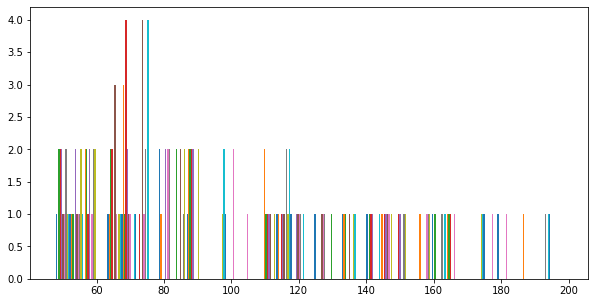

In [36]:
plt.hist(trip)
#plt.savefig('foo1.png')

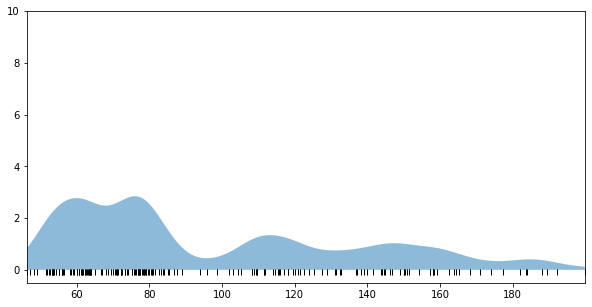

In [37]:
trip = trip.flatten()
from scipy.stats import norm
x_d = np.linspace(min(trip), max(trip), 2000)
density = sum(norm(xi,5).pdf(x_d) for xi in trip) * 1
plt.fill_between(x_d, density, alpha=0.5)
plt.plot(trip, np.full_like(trip, -0.1), '|k', markeredgewidth=1)
plt.axis([min(trip), max(trip), -0.5, 10]);
#plt.savefig('foo2.png')

In [38]:
'''for n in RNAi_bed_assignments: 
    trip = np.array(RNAi_bed_assignments['APX-1'])
    trip = np.array(trip).flatten()
    plt.hist(trip);plt.savefig('.png')'''
    

"for n in RNAi_bed_assignments: \n    trip = np.array(RNAi_bed_assignments['APX-1'])\n    trip = np.array(trip).flatten()\n    plt.hist(trip);plt.savefig('.png')"

In [39]:
#trip = t_mat.T[0];plt.hist(trip)

In [40]:
fulldictset = refdictset + dictset
fullnameset = refnameset + nameset

In [41]:
b_mat_2 = []
size_edit_mat_2 = []
t_mat_2 = []
for n in range(0,len(fulldictset)):
    t_row = []
    r_row = []
    b_row = []
    for m in range(0,len(fulldictset)):
        #go = cleaner(refdictset,refglobaldictset,m,match_links,dictset,globaldictset,n)
        go = fulldictset[m]
        r_row.append(len(go))
        t_row.append(tree_edit_distance(go,fulldictset[n]))
        b_row.append(branch_distance(go,fulldictset[n]))
    size_edit_mat_2.append(r_row)
    t_mat_2.append(t_row)
    b_mat_2.append(b_row)
    if n % 20 == 0: print(n / len(fulldictset))
size_edit_mat_2 = np.mat(size_edit_mat_2)

0.0
0.014792899408284023
0.029585798816568046
0.04437869822485207
0.05917159763313609
0.07396449704142012
0.08875739644970414
0.10355029585798817
0.11834319526627218
0.13313609467455623
0.14792899408284024
0.16272189349112426
0.17751479289940827
0.19230769230769232
0.20710059171597633
0.22189349112426035
0.23668639053254437
0.2514792899408284
0.26627218934911245
0.28106508875739644
0.2958579881656805
0.3106508875739645
0.3254437869822485
0.34023668639053256
0.35502958579881655
0.3698224852071006
0.38461538461538464
0.3994082840236686
0.41420118343195267
0.4289940828402367
0.4437869822485207
0.45857988165680474
0.47337278106508873
0.4881656804733728
0.5029585798816568
0.5177514792899408
0.5325443786982249
0.5473372781065089
0.5621301775147929
0.5769230769230769
0.591715976331361
0.606508875739645
0.621301775147929
0.636094674556213
0.650887573964497
0.665680473372781
0.6804733727810651
0.6952662721893491
0.7100591715976331
0.7248520710059172
0.7396449704142012
0.7544378698224852
0.76923

In [79]:
size_edit_mat_2 = np.mat(size_edit_mat_2)
b_mat_2 = np.mat(b_mat_2);t_mat_2 = np.mat(t_mat_2)
print(size_edit_mat_2.shape,b_mat_2.shape,t_mat_2.shape)

(1352, 1352) (1352, 1352) (1352, 1352)


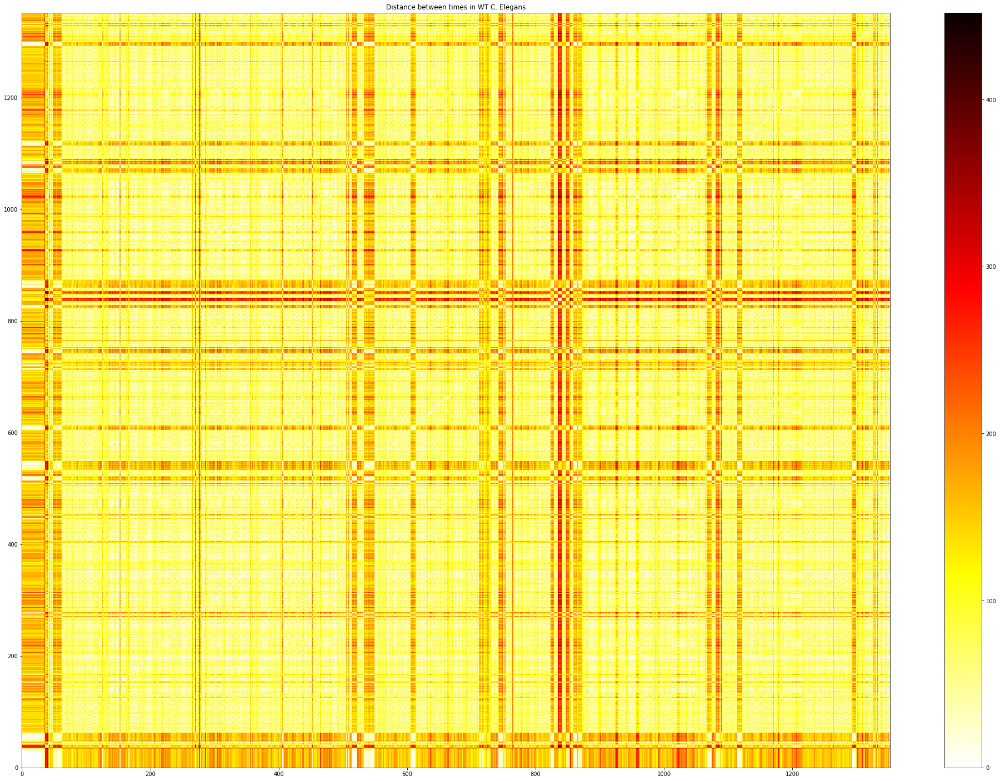

In [80]:
plot_2_examples(['hot_r'],np.mat(t_mat_2))

/tmp/ipykernel_44771/575860760.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(np.mat(t_mat_2), 'average')


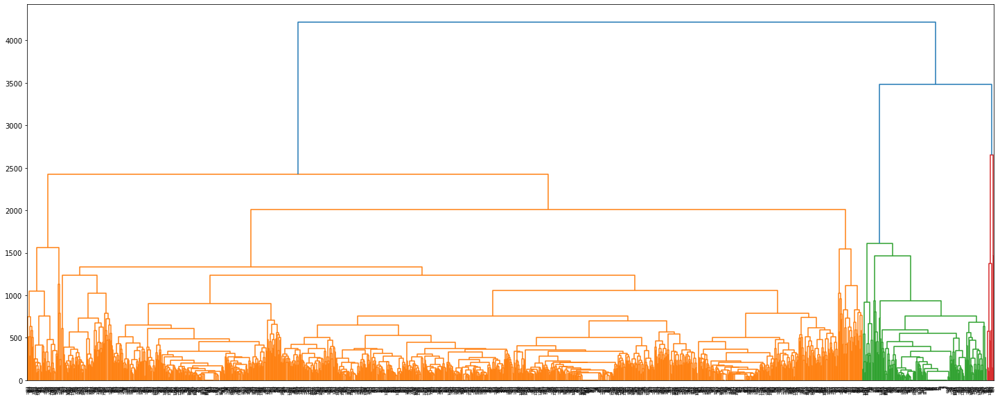

In [81]:
Z = linkage(np.mat(t_mat_2), 'average')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z)
#fcluster(Z, t=6, criterion='maxclust') 
que = fcluster(Z, t=6, criterion='maxclust') 

[48, 1086, 34, 174, 8, 2]


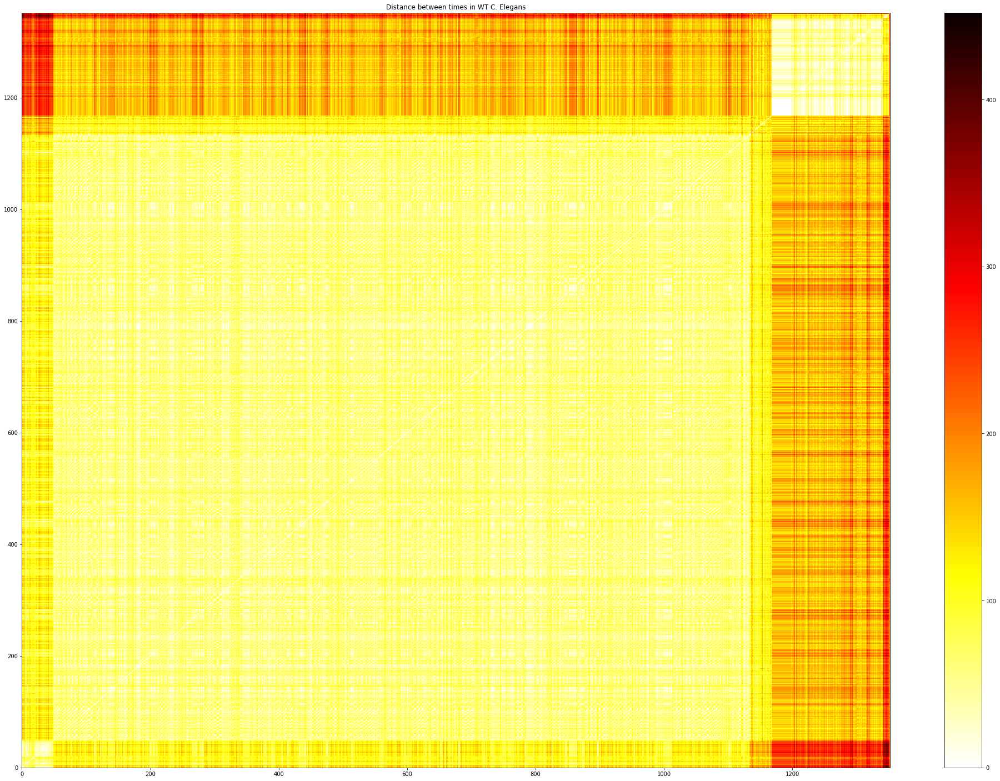

In [82]:
oop = np.where(que == 1)[0].tolist()
lenz = [len(oop)]
for n in range(2,7):
    oop = oop + np.where(que == n)[0].tolist()
    lenz.append(len(np.where(que == n)[0].tolist()))
print(lenz)
plot_2_examples(['hot_r'],(np.mat(t_mat_2)[oop]).T[oop])

/tmp/ipykernel_44771/2573477309.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(np.mat(t_mat_2), 'average')


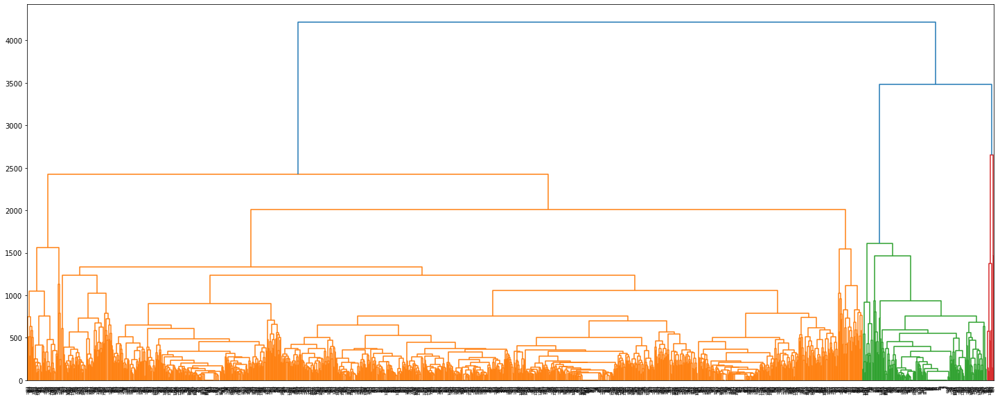

In [85]:
Z = linkage(np.mat(t_mat_2), 'average')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z)
#fcluster(Z, t=6, criterion='maxclust') 
que = fcluster(Z, t=80, criterion='distance') 

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 3, 3, 1, 22, 7, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 3, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

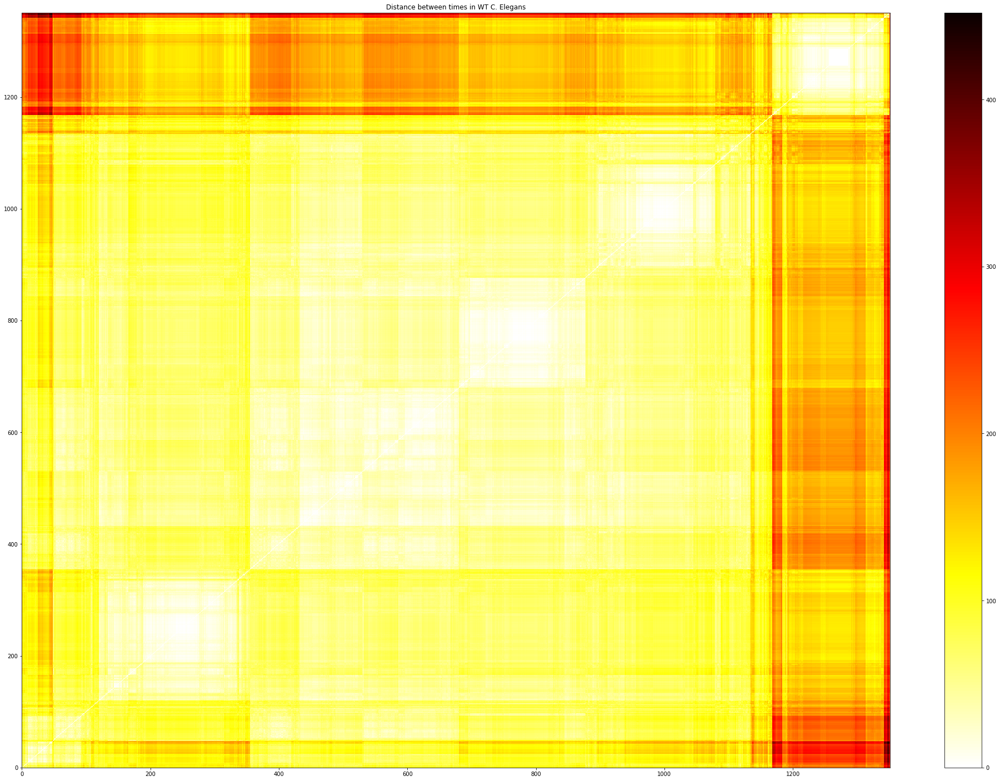

In [86]:
oop = np.where(que == 1)[0].tolist()
lenz = [len(oop)]
for n in range(2,max(que)):
    oop = oop + np.where(que == n)[0].tolist()
    lenz.append(len(np.where(que == n)[0].tolist()))
print(lenz)
plot_2_examples(['hot_r'],(np.mat(t_mat_2)[oop]).T[oop])

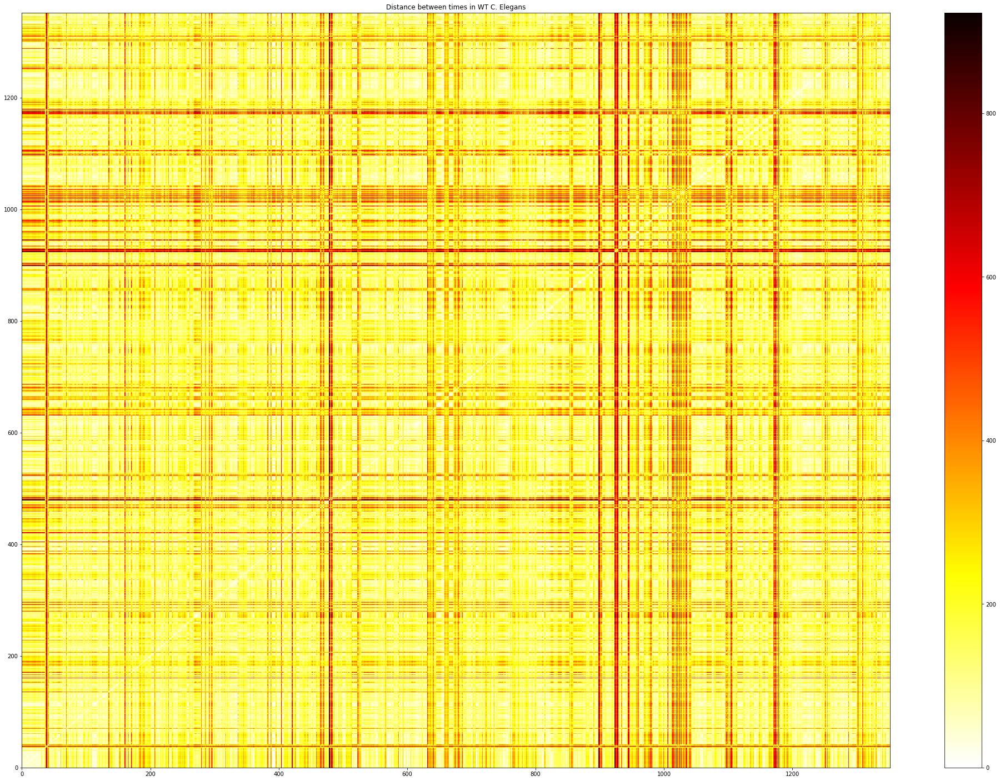

In [983]:
plot_2_examples(['hot_r'],np.mat(b_mat_2))

/tmp/ipykernel_1699211/2068684029.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(np.mat(b_mat_2), 'average')


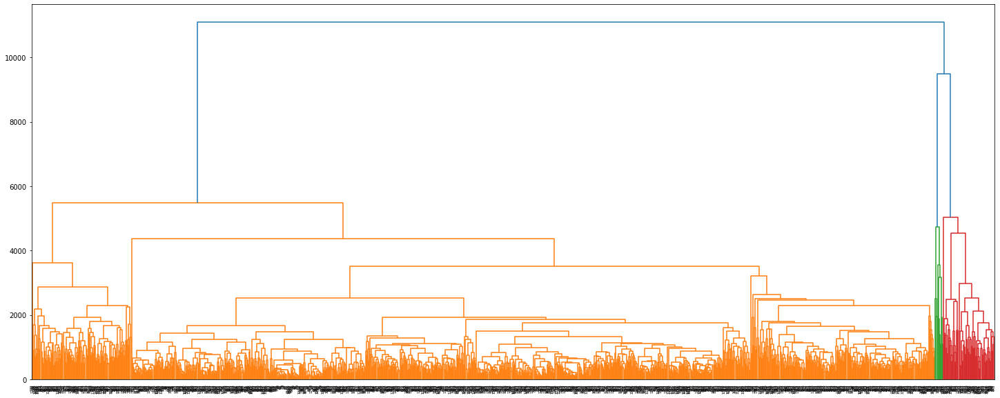

In [1046]:
Z = linkage(np.mat(b_mat_2), 'average')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z)
#fcluster(Z, t=6, criterion='maxclust') 
que = fcluster(Z, t=6, criterion='maxclust') 

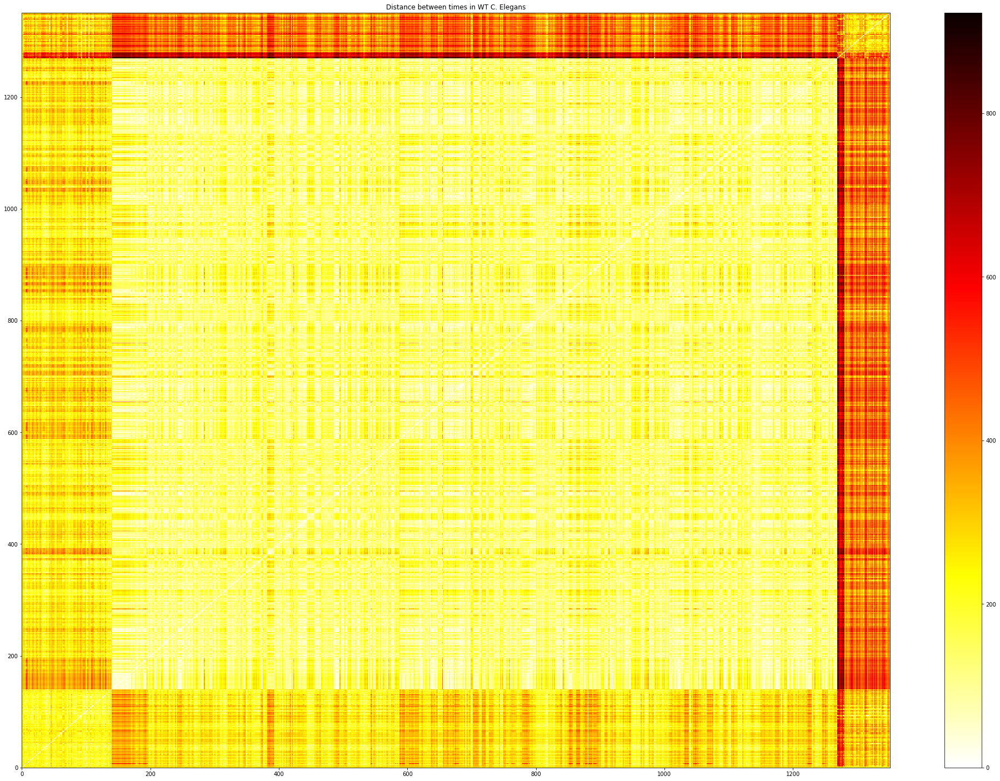

In [1047]:
oop = np.where(que == 1)[0].tolist()
lenz = [len(oop)]
for n in range(2,7):
    oop = oop + np.where(que == n)[0].tolist()
    lenz.append(len(np.where(que == n)[0].tolist()))
print(lenz)
plot_2_examples(['hot_r'],(np.mat(b_mat_2)[oop]).T[oop])

/tmp/ipykernel_44771/3623067635.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(np.mat(b_mat_2), 'average')


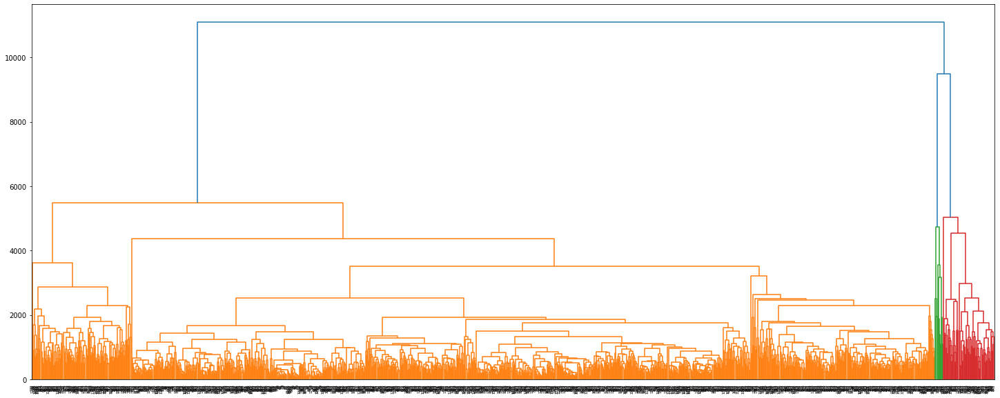

In [95]:
Z = linkage(np.mat(b_mat_2), 'average')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z)
#fcluster(Z, t=6, criterion='maxclust') 
que = fcluster(Z, t=80, criterion='distance') 

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

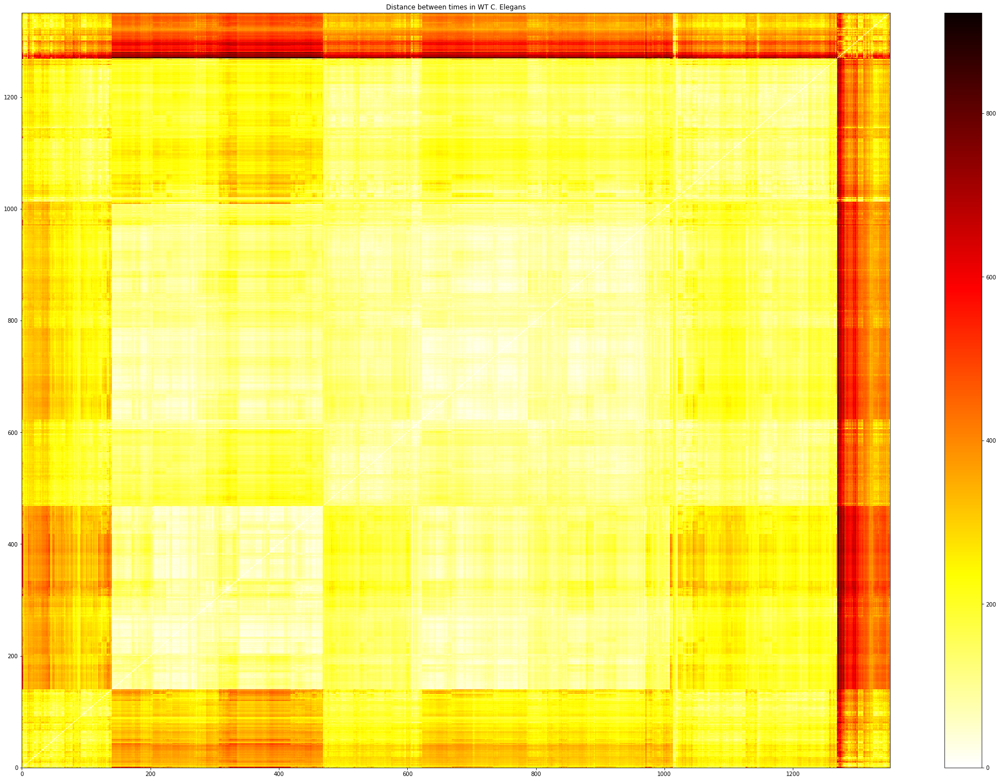

In [96]:
oop = np.where(que == 1)[0].tolist()
lenz = [len(oop)]
for n in range(2,max(que)):
    oop = oop + np.where(que == n)[0].tolist()
    lenz.append(len(np.where(que == n)[0].tolist()))
print(lenz)
plot_2_examples(['hot_r'],(np.mat(b_mat_2)[oop]).T[oop])

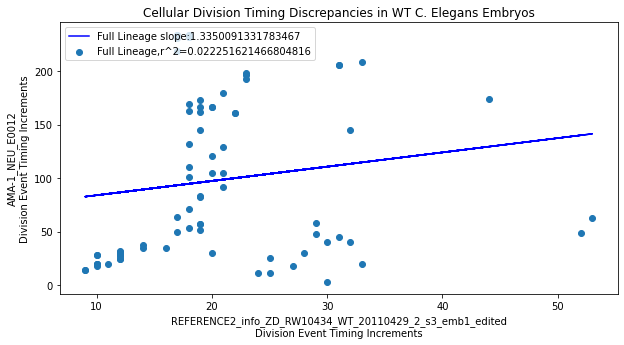

In [699]:
def dict_to_scatter_connect(name,lis,x,yname,ylis,y,img = False,seps='', tier = False):
    xaxis = [];yaxis = []
    target_xaxis=[];target_yaxis=[]
    if seps == '' or tier == True:
        for n in (list(set(lis[x]).intersection(set(ylis[y])))):
            xaxis.append(lis[x][n]);yaxis.append(ylis[y][n])
    else:
        target_xaxis=[];target_yaxis=[]
        for n in (list(set(lis[x]).intersection(set(ylis[y])))):
            if seps in n:
                target_xaxis.append(lis[x][n])
                target_yaxis.append(ylis[y][n])
            else:
                xaxis.append(lis[x][n]);yaxis.append(ylis[y][n])
    target_xaxis = np.array(target_xaxis);xaxis = np.array(xaxis)
    if tier == True: return xaxis, yaxis
    m, b, r, p_value, std_err = stats.linregress(np.append(xaxis,target_xaxis),yaxis+target_yaxis)
    #switch to siegelslope & theilsslope functions?
    name1,name2 = name[x].split('/')[-1][:-4],yname[y].split('/')[-1][:-4]
    if img == False: return m,b,r,name1,name2
    plt.scatter(xaxis,yaxis, label='Full Lineage,r^2='+str(r**2) ) #''', c = [0]*len(xaxis) ''')
    plt.title('Cellular Division Timing Discrepancies in WT C. Elegans Embryos');plt.xlabel(name1+'\nDivision Event Timing Increments');plt.ylabel(name2+'\nDivision Event Timing Increments')
    plt.plot(xaxis, (m*xaxis) + b, 'b-', label='Full Lineage slope:'+str(m), )
    if seps != '':
        target_xaxis = np.array(target_xaxis)
        m, b, r, p_value, std_err = stats.linregress(target_xaxis,target_yaxis)
        plt.plot(target_xaxis, (m*target_xaxis) + b, 'r-', label=seps+' slope:'+str(m))
        plt.scatter(target_xaxis,target_yaxis, label = seps+',r^2='+str(r**2) ) #''', c = [1]*len(target_xaxis) ''')
        xaxis = np.append(xaxis,target_xaxis); yaxis = np.append(yaxis,target_yaxis)
    m, b, r, p_value, std_err = stats.linregress(xaxis,yaxis)
    plt.legend(loc='upper left')
    #print(xaxis,target_xaxis)
    #print(np.append(xaxis,target_xaxis))
    #print(yaxis,target_yaxis)
    #print(np.append(yaxis,target_yaxis))
    #plt.savefig(name1+'&'+name2+'.png') #return m,b,r,name1,name2
    plt.show()
    
dict_to_scatter_connect(refnameset,refdictset,1,nameset,dictset,9,img=True)